# Petrol Pipeline Anamoly Detection
#### Using Image Processing
<br>

### Problem
- Detect the `position of anamolies/flaws/metal loss` in petrol pipelines(each pipe) using data provided by a device called "Pig" that travels inside the pipes.

<br>

### Business Understanding
- A long Petrol pipeline is not a singular material. It is a serial combination of smaller pipes fused with wielding process. There may also be other cracks/distortions that may appear with time or some incident. So a `PIG` travels inside pipelines to generate data using magnetic flux with pipe using it's 84 sensors inside pipe's circumference.

<img src='../Images/petrol-pipe.jpg' width=200 height=200/>
<img src='../Images/pig.jpg' width=200 height=200/>
<br><br>
Each "Pig" has 84 sensors in circumference that captures data every millisecond while travelling in pipes. So this becomes a `time series problem' where each traversal time for each independent pipe is 5_000 milliseconds.

<br><br>

### About Data
- Data is in binary format saved in - 'captured_data.bin' file, captured from 84 sensors for 50_000 milliseconds
- Pigs directly captured/store data in `binary(.bin)` format

<font color='red'><b>This is the second version of the [previous](/Notebooks/anamoly-detection.ipynb) notebook. Look into it to get the base insights.

In [1]:
# Standard Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

import cv2 as cv

In [2]:
# Loading Binary Data
data = np.fromfile('../Data/captured_data.bin', dtype='B', count=-1)
data = data.reshape(-1,84)
data = pd.DataFrame(data)
data.head()

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,83
0,127,105,103,99,111,111,101,103,101,0,...,107,109,107,103,103,115,0,0,109,101
1,127,105,103,99,111,111,101,103,101,0,...,107,109,107,103,103,115,0,0,109,103
2,127,105,103,99,111,111,101,101,101,0,...,107,109,107,103,101,113,0,0,109,103
3,127,105,103,99,111,111,101,101,101,0,...,107,109,107,103,103,113,0,0,109,103
4,127,105,103,99,111,111,101,101,99,0,...,107,109,107,103,103,113,0,0,109,103


In [3]:
data[0].mode()[0]

127

In [4]:
# Column wise normalising to allot each sensor to same color to their mean value
colwise_norm_data = pd.DataFrame()
for i,col in enumerate(data.columns):
    col_min, col_mode = data[col].min(), data[col].mode()[0]
    colwise_norm_data[col] = data[col].apply(lambda x: (x - col_min) / (col_mode - col_min) if col_mode!=0 else 1)
    print(i, end=',')

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,

In [5]:
colwise_norm_data.head()

,0,1,2,3,4,5,6,7,8,9,...,74,75,76,77,78,79,80,81,82,83
0,1.0,1.0,1.0,1.0,1.0,0.833333,1.0,1.000000,1.000000,1,...,1.0,1.0,1.0,0.833333,1.000000,1.00,1,1,1.0,0.833333
1,1.0,1.0,1.0,1.0,1.0,0.833333,1.0,1.000000,1.000000,1,...,1.0,1.0,1.0,0.833333,1.000000,1.00,1,1,1.0,1.000000
2,1.0,1.0,1.0,1.0,1.0,0.833333,1.0,0.857143,1.000000,1,...,1.0,1.0,1.0,0.833333,0.833333,0.75,1,1,1.0,1.000000
3,1.0,1.0,1.0,1.0,1.0,0.833333,1.0,0.857143,1.000000,1,...,1.0,1.0,1.0,0.833333,1.000000,0.75,1,1,1.0,1.000000
4,1.0,1.0,1.0,1.0,1.0,0.833333,1.0,0.857143,0.833333,1,...,1.0,1.0,1.0,0.833333,1.000000,0.75,1,1,1.0,1.000000


Grid: 
[[0.7003673  0.74275081 0.70928001 0.56674552]
 [0.97778533 0.70633485 0.24791576 0.15788335]
 [0.69769852 0.71995667 0.25774443 0.34154678]
 [0.96876117 0.6945071  0.46638326 0.7028127 ]]


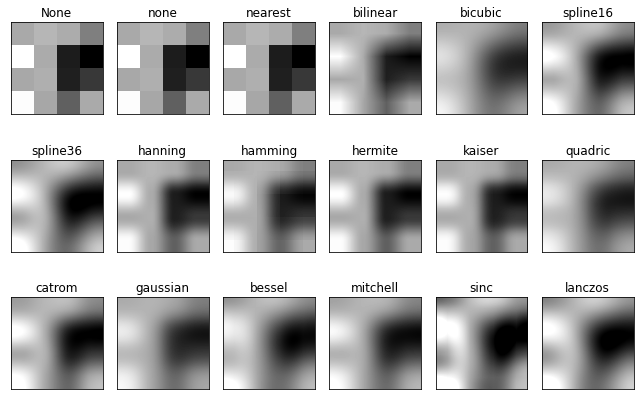


When an array has shape (M,N,3) or (M,N,4), the values in that array are interpreted as RGB or RGBA values resp.
In this case the cmap is ignored.
However, if the array were an array of shape (M,N), then the cmap controls the colormap used to display the values.

Example: The colormap is a dictionary which maps numbers to colors. Matplotlib provides many built-in colormaps. When you have a 2D array, such as data above, the values at each grid point is a float between 0 and 1. The gray colormap maps 0 to black and 1 to white. The jet colormap maps 0 to blue and 1 to red.

the minimum and maximum values of data could be different from 0 and 1. The imshow function normalizes data so that min(data) gets mapped to 0 and max(data) gets mapped to 1. Then the colormap is applied.

Let imshow know vmin(min_value), vmax(max_value) values to assist in normalising & 
assisting cmap in allocating color between lowest and highest, 
Min data val: 0.1578833509209533, Max data val: 0.9777853328245762


In [6]:
# Refencing 
import matplotlib.pyplot as plt
import numpy as np

interpolation_methods = [None, 'none', 'nearest', 'bilinear', 'bicubic', 'spline16',
           'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric',
           'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos']

# Fixing random state for reproducibility
np.random.seed(19680801)
grid = np.random.rand(4, 4)
data_min, data_max = grid.min(), grid.max()
print(f'Grid: \n{grid}')

fig, axs = plt.subplots(nrows=3, ncols=6, figsize=(9, 6),
                        subplot_kw={'xticks': [], 'yticks': []})

for ax, interp_method in zip(axs.flat, interpolation_methods):
    ax.imshow(grid, interpolation=interp_method, cmap='gray', vmin=data_min, vmax=data_max)
    ax.set_title(str(interp_method))
    
plt.tight_layout()
plt.show()

print("\nWhen an array has shape (M,N,3) or (M,N,4), the values in that array are interpreted as RGB or RGBA values resp.\nIn this case the cmap is ignored.\nHowever, if the array were an array of shape (M,N), then the cmap controls the colormap used to display the values.")
print("\nExample: The colormap is a dictionary which maps numbers to colors. Matplotlib provides many built-in colormaps. When you have a 2D array, such as data above, the values at each grid point is a float between 0 and 1. The gray colormap maps 0 to black and 1 to white. The jet colormap maps 0 to blue and 1 to red.")
print("\nthe minimum and maximum values of data could be different from 0 and 1. The imshow function normalizes data so that min(data) gets mapped to 0 and max(data) gets mapped to 1. Then the colormap is applied.")
print(f'\nLet imshow know vmin(min_value), vmax(max_value) values to assist in normalising & \nassisting cmap in allocating color between lowest and highest, \nMin data val: {data_min}, Max data val: {data_max}')
print("\nThe imshow function can accept a data array of shape (n,m), (n,m,3) or (n,m,4). When you specify a colormap, the data array must be of shape (n,m). Per the docs, 'cmap is ignored when X has RGB(A) information.")
print("\nLink Discussion: https://stackoverflow.com/questions/25625952/matplotlib-what-is-the-function-of-cmap-in-imshow")

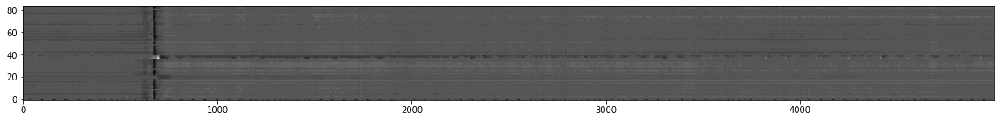

In [7]:
# Visualise small sample
plt.figure(figsize=(20,2))
plt.imshow(colwise_norm_data.iloc[:5000,:].T, aspect='auto', cmap='gray', origin='lower');

In [8]:
from scipy.ndimage import gaussian_filter
from mpl_toolkits.axes_grid1 import make_axes_locatable

def see_pipe(number=0, cmap='gray', interpolation='nearest', blur_amount=0, figsize=(25,4), xticks_rotation=0, pipe=None):
    
    '''
    Create an image of the pipe with blur and color style 
    Parameters:
    -----------
    pipe_no: pipe number to be visualised ->  [0,9)
    cmap: color map for imshow 
    interpolation: if any
    figsize: tuple
    blur_amount: to be gaussian blurred -> {0,1,2,...}
    xticks_rotation: if they overlap
    -----------
    '''
    
    # Slice out Image Data
    pipe_start = number*5_000
    img_arr = colwise_norm_data.iloc[pipe_start:pipe_start+5_000, :].T
    
    # Apply gaussian blur if any
    img_arr = gaussian_filter(img_arr, blur_amount) if blur_amount != 0 else img_arr
    
    # Plot
    fig, ax = plt.subplots(figsize = (23,3))
    if pipe is not None:
        im = plt.imshow(pipe, aspect='auto', interpolation=interpolation, cmap=cmap, origin='lower')
    else:
        im = plt.imshow(img_arr, aspect='auto', interpolation=interpolation, cmap=cmap, origin='lower')
    
    # Save image without labels
    ax.set_xticks([]); ax.set_yticks([]);
    plt.tight_layout(pad=0)
    plt.savefig(f'../Images/Visualised-Pipes/Without-Metadata/Pipe-{number}.png')
    
    # Set labels
    ax.set_title(f'Pipe {number}')
    plt.xlabel('Length')
    plt.ylabel('Circumference')
    x_values = np.arange(start=pipe_start, stop=pipe_start+5_000, step=100)
    x_labels = [str(x) for x in x_values]
    ax.set_xticks(ticks=np.arange(0,5_000,100))
    ax.set_xticklabels(x_labels)
    ax.tick_params(axis='x', rotation=45)
    
    # Plot Color bar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='3%', pad=0.11)
    fig.colorbar(im, cax=cax, orientation='vertical')
    
    # Save image with labels
    plt.tight_layout(pad=0)
    plt.savefig(f'../Images/Visualised-Pipes/With-Metadata/Pipe-{number}.png', bbox_inches='tight', pad_inches=0)
    
    return img_arr

(84, 5000)

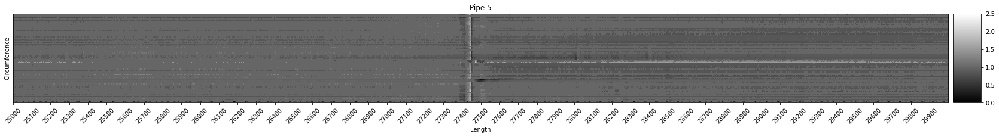

In [9]:
pipe5 = see_pipe(number=5, xticks_rotation=50)
pipe5.shape

**Observations:**
> <font color='green'>**Our First observation is that of the wielding position that connects joints any two pipes together**</font>        
Consider this image as a round opened circular pipe into a rectanglular shape

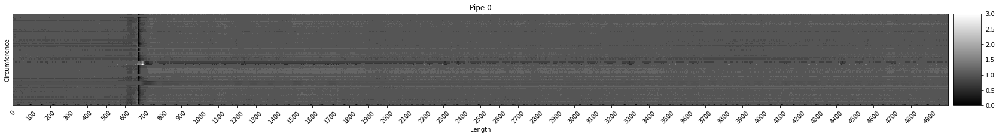

In [10]:
x = see_pipe(number=0)

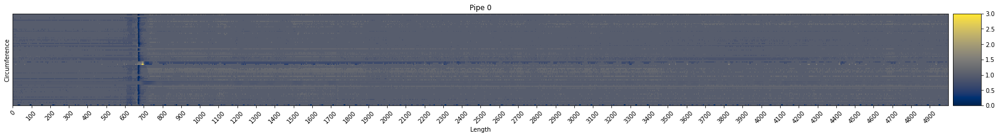

In [11]:
# Apply another cmap 
x = see_pipe(number=0, cmap='cividis')

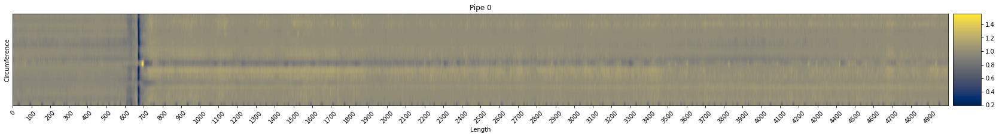

In [12]:
# Apply Blur so we can ignore noise and focus on bigger picture
x = see_pipe(number=0, cmap='cividis', blur_amount=2)

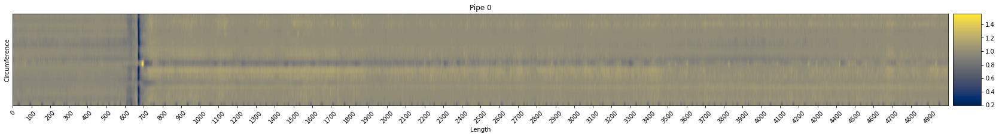

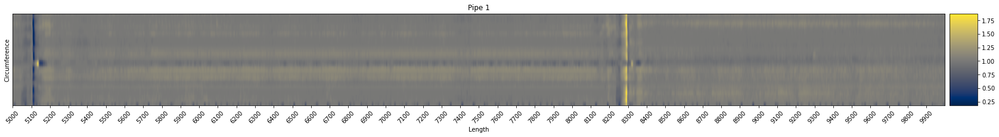

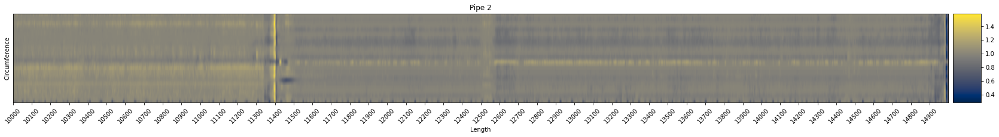

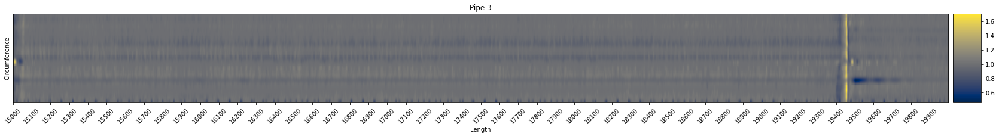

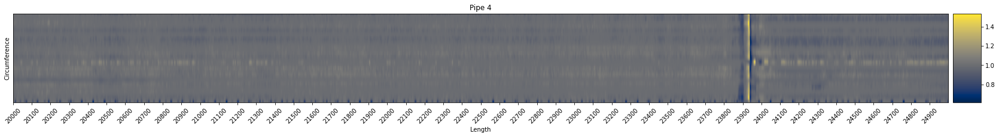

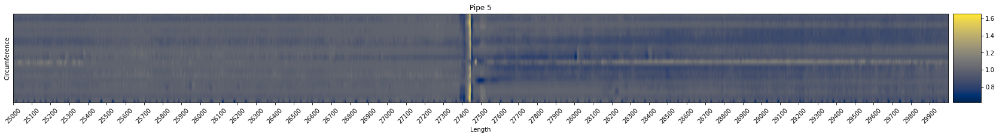

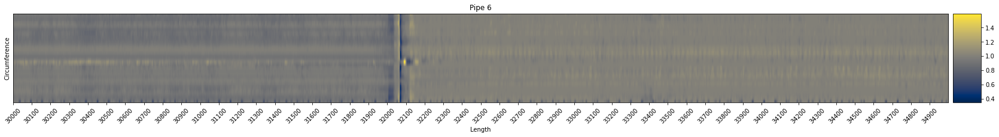

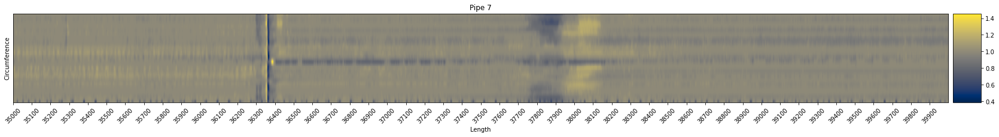

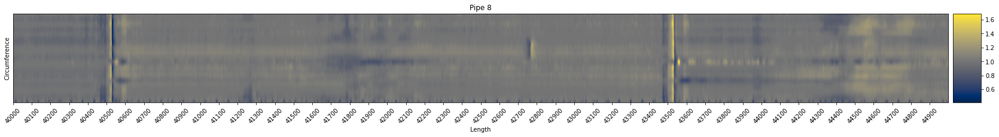

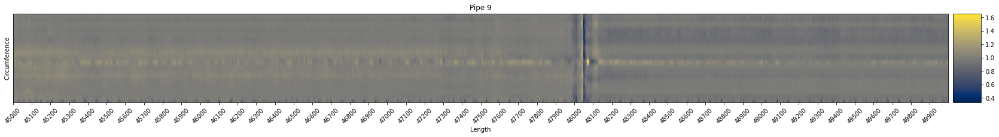

In [13]:
# Visualise all pipes and detect anamolies manually
for number in range(10):
    see_pipe(number=number,cmap='cividis', xticks_rotation=40, blur_amount=2)

**Observations:**
> <font color='green'>**First of all, we can infer that radial alignment of sensor around 38 and 20 is a bit tilted forward, so we should correct them mechanically**     
> **Secondly, we can also see there are places in pipes where unwanted magnetic flux is found( pipe 5&8 mostly), this could be because**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


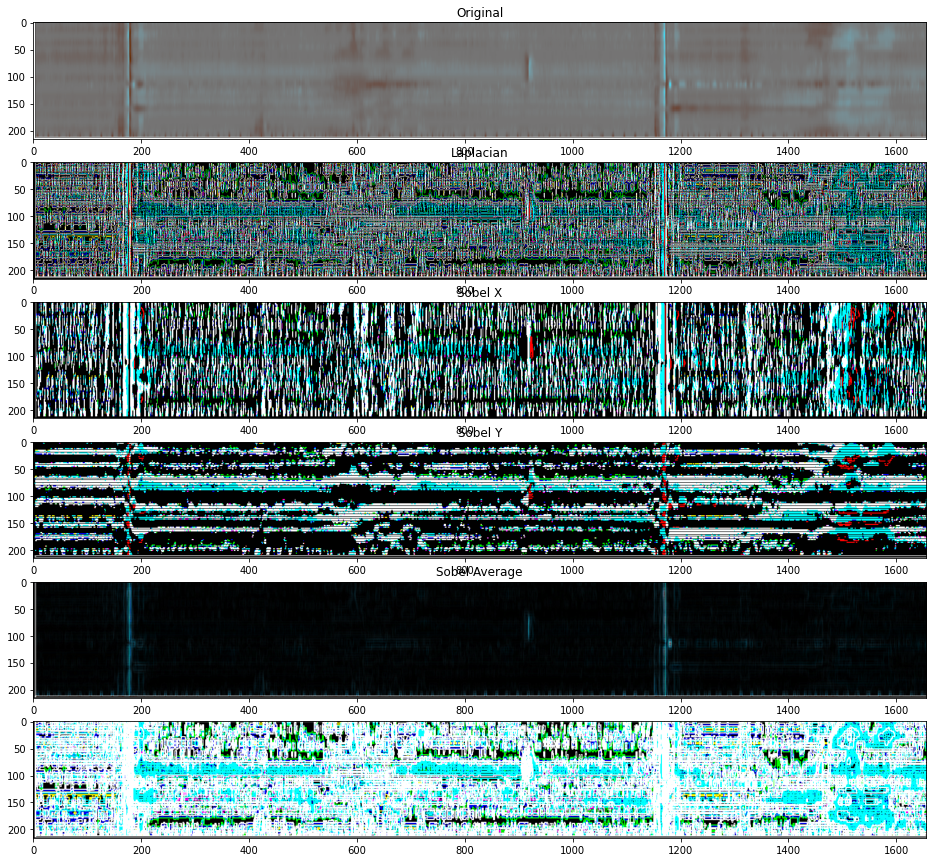

In [14]:
# Detecting edges
import cv2
from cv2 import GaussianBlur

# loading image
img = cv2.imread('../Images/Visualised-Pipes/Without-Metadata/Pipe-8.png')

# converting to gray scale
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# remove noise(blur)
# cv2.GaussianBlur(src=gray, dst=gray, ksize=(3,3) ,sigmaX=1)

# convolute with proper kernels
laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3)  # x-kernal/filter
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=3)                                # y-kernal/filter

# average x&y
abs_grad_x = cv2.convertScaleAbs(sobelx)
abs_grad_y = cv2.convertScaleAbs(sobely)
sobelxy = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

plt.figure(figsize=(20,15))
plt.subplot(6,1,1)
plt.imshow(img); plt.title('Original')#, plt.xticks([]), plt.yticks([])

plt.subplot(6,1,2)
plt.imshow(laplacian), plt.title('Laplacian')#, plt.xticks([]), plt.yticks([])

plt.subplot(6,1,3)
plt.imshow(sobelx); plt.title('Sobel X')#, plt.xticks([]), plt.yticks([])

plt.subplot(6,1,4)
plt.imshow(sobely); plt.title('Sobel Y')#, plt.xticks([]), plt.yticks([])

plt.subplot(6,1,5)
plt.imshow(sobelxy); plt.title('Sobel Average')#, plt.xticks([]), plt.yticks([])

plt.subplot(6,1,6)
plt.imshow(np.arctan(sobelxy).astype('float32'));# plt.title('arctan'), plt.xticks([]), plt.yticks([])

plt.show()

**In this case, <font color='green'>We'll have to consider only <u>Sobel Average</u> kernal for detecting `metal loss` or else we can use <u>Sobel X</u> to detect only `wieldings`</font> as *Sobel X & Sobel Y* kernals will produce edges for every little detail and not the actual anamoly**

In [15]:
def show_anamoly(number=0):
    
    # loading image
    img = cv2.imread(f'../Images/Visualised-Pipes/Without-Metadata/Pipe-{number}.png') 
    
    # convolute with proper kernels
    laplacian = cv2.Laplacian(img,cv2.CV_64F)
    sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3)  # x-kernal/filter
    sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=3)  # y-kernal/filter

    # average x&y
    abs_grad_x = cv2.convertScaleAbs(sobelx)
    abs_grad_y = cv2.convertScaleAbs(sobely)
    sobelxy = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
    
    fig,ax = plt.subplots(figsize=(30,18))
    ax.set_title(f'Pipe {number}')
    pipe_start=number*5000
    plt.imshow(sobelxy)
    
    # Save image without labels as they are deceptive(they are pixels and not positions)
    ax.set_xticks([]); ax.set_yticks([]);
    plt.tight_layout(pad=0)
    plt.savefig(f'../Images/Visualised-Pipes/Analysed/Pipe-{number}.png', bbox_inches='tight', pad_inches=0)

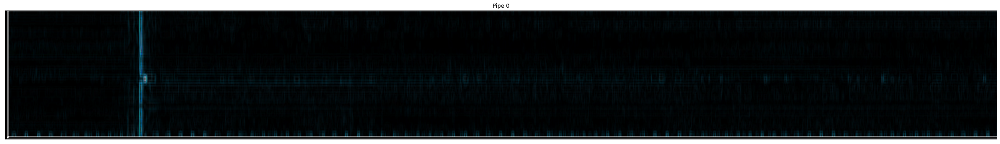

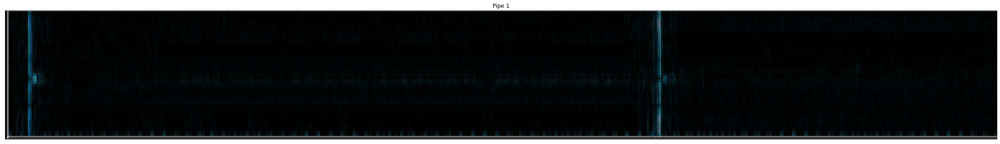

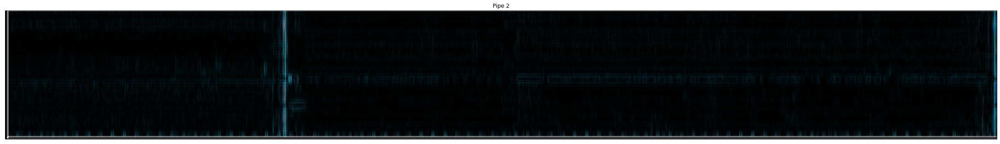

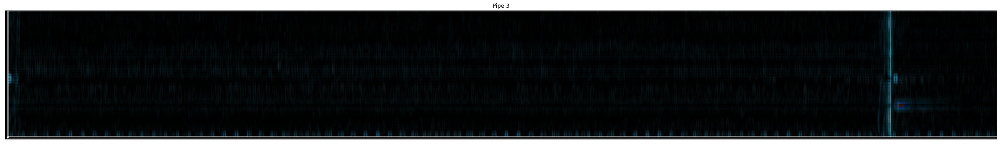

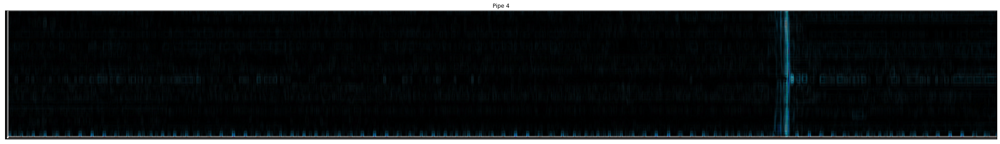

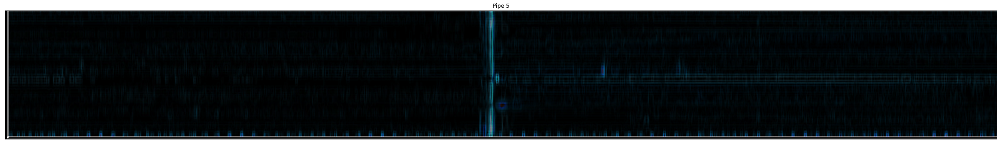

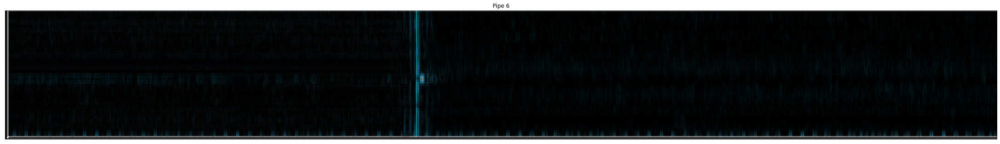

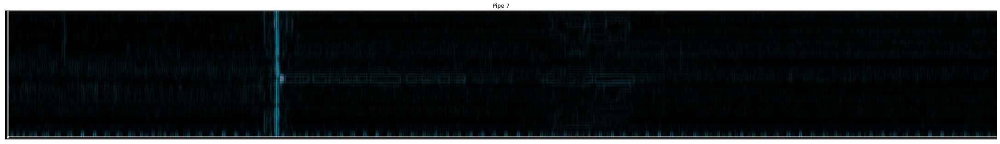

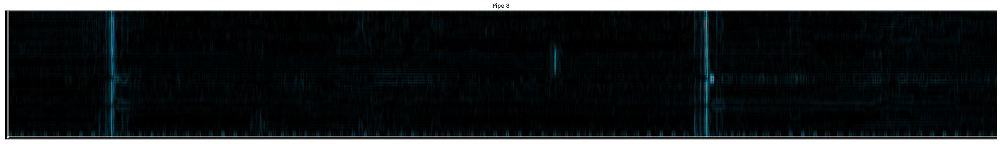

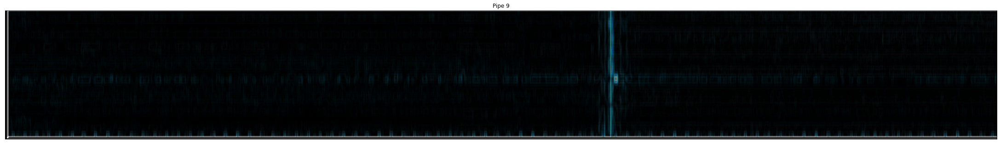

In [16]:
for number in range(10):
    show_anamoly(number)

**<font color='green'>Great! Now we can actually visually spot the positions wheere the iron is wielded as well as where anamoly is present**

# To Summarise the Project

In [17]:
# Create Custom Kernal
kernel = np.ones((9,5), np.float32)
kernel = kernel*6
kernel[:,2]=0
kernel

array([[6., 6., 0., 6., 6.],
       [6., 6., 0., 6., 6.],
       [6., 6., 0., 6., 6.],
       [6., 6., 0., 6., 6.],
       [6., 6., 0., 6., 6.],
       [6., 6., 0., 6., 6.],
       [6., 6., 0., 6., 6.],
       [6., 6., 0., 6., 6.],
       [6., 6., 0., 6., 6.]], dtype=float32)

In [20]:
def get_wield_of_pipe(number=0):
    pipe_start=number*5000
    img = colwise_norm_data.iloc[pipe_start:pipe_start+5000,:].T
    img = np.array(img, dtype='float32')
    sobelx = cv2.Sobel(src=img,ddepth=cv2.CV_64F,dx=1,dy=0, ksize=7 )
    gaussian = cv2.GaussianBlur(src=sobelx,ksize=(11,11),sigmaX=0)
    ret,th3 = cv2.threshold(src=gaussian,thresh=gaussian.min()//6, maxval=gaussian.max(), type=cv2.THRESH_TOZERO_INV)
    # Note: If we'll imshow the image, and histplot the values and threshold, we'll get incorrect reading due to automatically alterated values because of cmap, so directly estimate by trial and error min value and max value for thresholding
    dst = cv2.filter2D(src=th3,ddepth=-1,kernel=kernel)
    
    # Plot
    fig, ax = plt.subplots(figsize = (23,3))
    plt.imshow(dst, aspect='auto', cmap='gray')
    ax.set_title(f'Pipe {number}')
    plt.xlabel('Length')
    plt.ylabel('Circumference')
    x_values = np.arange(start=pipe_start, stop=pipe_start+5_000, step=100)
    x_labels = [str(x) for x in x_values]
    ax.set_xticks(ticks=np.arange(0,5_000,100))
    ax.set_xticklabels(x_labels)
    ax.tick_params(axis='x', rotation=45)
    
    # Save image with labels
    plt.savefig(f'../Images/Visualised-Pipes/Wield-Positions/Pipe-{number}.png', bbox_inches='tight', pad_inches=0)
    return dst

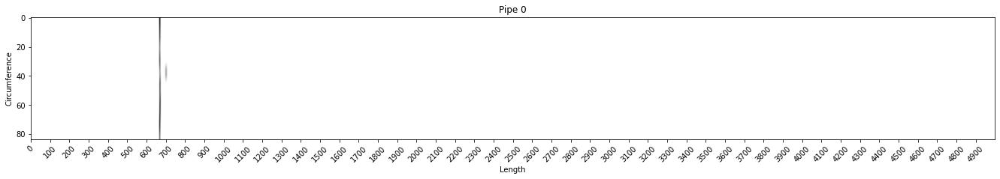

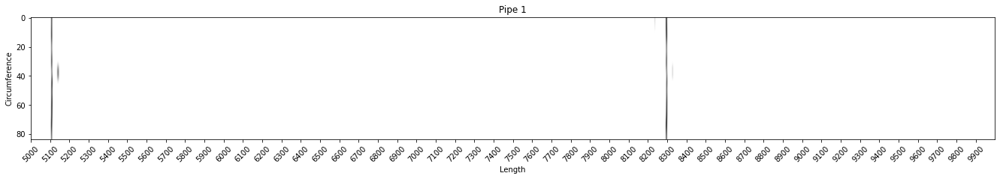

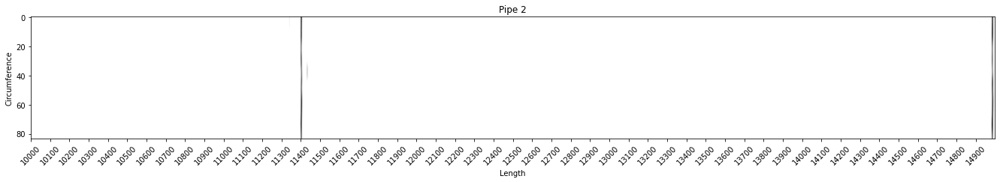

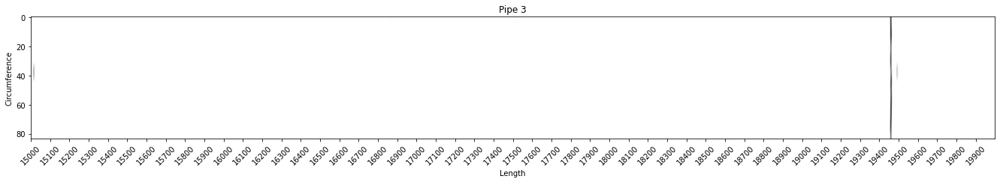

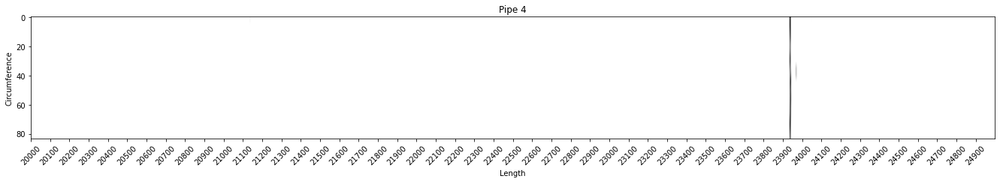

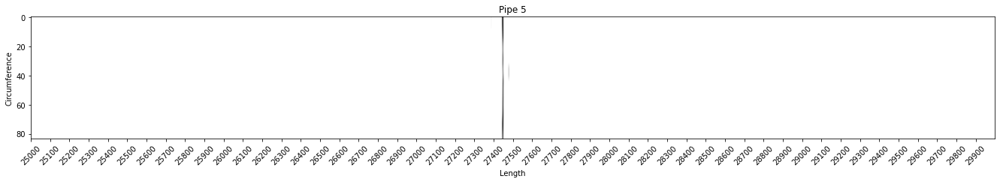

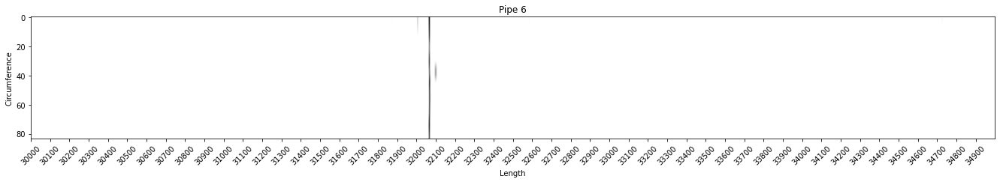

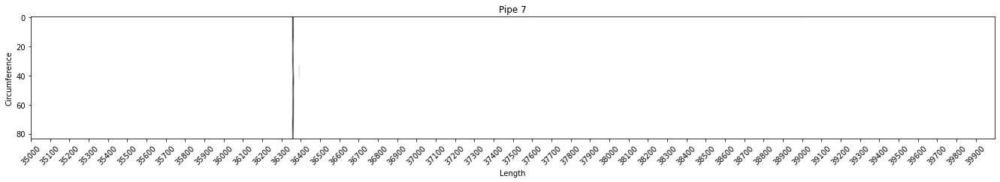

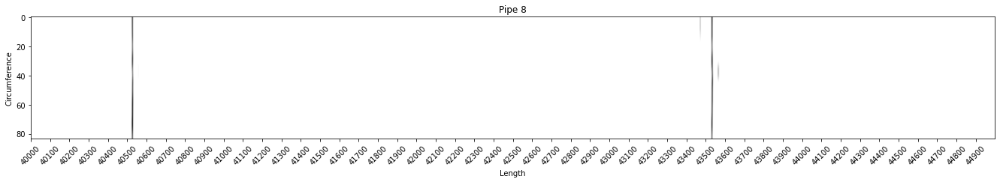

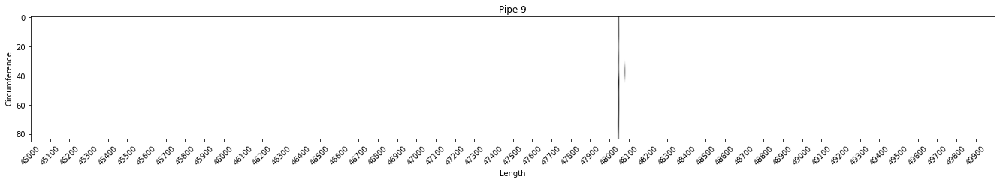

In [21]:
for number in range(10):
    x = get_wield_of_pipe(number=number)

References used:
> Sobel Operator     
- [OpenCV](https://docs.opencv.org/3.4/d2/d2c/tutorial_sobel_derivatives.html)    
- [Youtube](https://www.youtube.com/watch?v=uihBwtPIBxM&t=169s)     
- [Wiki](https://en.wikipedia.org/wiki/Sobel_operator)   
- [Blog](https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Gradient_Sobel_Laplacian_Derivatives_Edge_Detection.php)